# Global Missing Migrants Dataset

## Installations

In [12]:
# !pip3 install --upgrade pip

In [13]:
# %pip install geopandas
# %pip install tabulate

## Imports

In [31]:
import sys

from tabulate import tabulate
import numpy as np
import pandas as pd

import geopandas

from shapely.geometry import Point

import folium

import matplotlib.pyplot as plt
%matplotlib inline

import contextily as cx

## Display Imports & Their Versions

In [32]:
headers = ["Software/Library", "Version"]

table_data = [
    ['Python', sys.version[0:6]],
    ['NumPy', np.__version__],
    ['Pandas', pd.__version__],
    ['geopandas', geopandas.__version__],
    ['Contextily', cx.__version__]
    ]

print(tabulate(table_data, headers=headers, tablefmt="grid"))

+--------------------+-----------+
| Software/Library   | Version   |
+====================+===========+
| Python             | 3.11.4    |
+--------------------+-----------+
| NumPy              | 1.26.4    |
+--------------------+-----------+
| Pandas             | 1.5.3     |
+--------------------+-----------+
| geopandas          | 1.0.1     |
+--------------------+-----------+
| Contextily         | 1.6.2     |
+--------------------+-----------+


## Import Dataset

In [33]:
df = geopandas.read_file("Global Missing Migrants Dataset.csv")

df

,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping
0,Incident,2014,January,Central America,North America,Guatemala,1,0,1,0,0,1,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America
1,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,0,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.59713, -111.73756",Northern America
2,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,0,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.94026, -113.01125",Northern America
3,Incident,2014,January,Central America,North America,Mexico,1,0,1,0,0,1,0,Violence,US-Mexico border crossing,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...","31.506777, -109.315632",Northern America
4,Incident,2014,January,Northern Africa,Europe,Sudan,1,0,1,2,0,1,0,Harsh environmental conditions / lack of adequ...,,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.1551, 28",Northern Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13015,Incident,2023,July,Western Asia,Western Asia,Syrian Arab Republic,4,0,4,0,0,4,0,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"In Ipsala, Edirne province, Türkiye - travelli...","Andalou Agency, Son Dakika, Orient News","40.91271268, 26.369657",Western Asia
13016,Incident,2023,July,Western Africa (P),Western Asia,Unknown,2,0,2,0,0,2,0,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"At the Kapıkule Türkiye-Bulgaria Border Gate, ...","Son Dakika, Hurriyet","41.71697242, 26.351489",Western Asia
13017,Incident,2023,July,Western Africa,Northern Africa,Senegal,13,0,13,6,0,0,0,Drowning,Western Africa / Atlantic route to the Canary ...,"Off the coasts of Dakhla, Western Sahara - 6 s...","Barron's News, InfoMigrants, IOM Morrocco","23.72836078, -15.901632",Uncategorized
13018,Incident,2023,July,Mixed,Northern Africa,Unknown,6,0,6,48,0,0,0,Drowning,Western Africa / Atlantic route to the Canary ...,"Unspecified location off the coast of Nador, M...","El Nashra, Swiss Info; CGTN, IOM Morrocco","35.17187365, -2.903182",Uncategorized


In [34]:
df.describe(include='all')

,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping
count,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020,13020
unique,4,10,12,34,16,336,87,120,137,228,48,59,20,15,26,7460,3804,9583,20
top,Incident,2022,June,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,0,1,0,Drowning,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,IOM Afghanistan,"30.96704016, 61.82069052",Northern America
freq,12670,2183,1269,2164,2706,7220,8914,11758,8879,10959,10678,6632,11447,3313,3392,1061,1538,200,2708


### Return Information About Unqiue Values in Select Features

In [35]:
cols_to_check = [
    "Incident Type",
    "Incident year",
    "Reported Month",
    "Region of Origin",
    "Region of Incident",
    "Country of Origin",
    "Number of Dead",
    "Minimum Estimated Number of Missing",
    "Total Number of Dead and Missing",
    "Number of Survivors",
    "Number of Females",
    "Number of Males",
    "Number of Children",
    "Cause of Death",
    "Migration route",
    "Location of death",
    "Information Source",
    "Coordinates",
    "UNSD Geographical Grouping"
]

for col in cols_to_check:
    u_vals = np.sort(df[col].unique())
    if len(u_vals) < 50:
        print(f"{col} ({len(u_vals)})\n{u_vals}\n")
    else:
        print(f"{col} ({len(u_vals)})\n")

Incident Type (4)
['Cumulative Incident' 'Incident' 'Incident,Split Incident'
 'Split Incident']

Incident year (10)
['2014' '2015' '2016' '2017' '2018' '2019' '2020' '2021' '2022' '2023']

Reported Month (12)
['April' 'August' 'December' 'February' 'January' 'July' 'June' 'March'
 'May' 'November' 'October' 'September']

Region of Origin (34)
['' 'Caribbean' 'Caribbean (P)' 'Central America' 'Central America (P)'
 'Central Asia' 'Eastern Africa' 'Eastern Africa (P)' 'Eastern Asia'
 'Eastern Asia (P)' 'Europe' 'Latin America / Caribbean (P)'
 'Middle Africa' 'Mixed' 'Northern Africa' 'Northern Africa (P)'
 'Northern America' 'Oceania' 'South America' 'South America (P)'
 'South-eastern Asia' 'South-eastern Asia (P)' 'Southern Africa'
 'Southern Asia' 'Southern Asia (P)' 'Sub-Saharan Africa'
 'Sub-Saharan Africa (P)' 'Unknown' 'Western / Southern Asia'
 'Western / Southern Asia (P)' 'Western Africa' 'Western Africa (P)'
 'Western Asia' 'Western Asia (P)']

Region of Incident (16)
['Cari

### Fix Missing Values

In [36]:
df['Region of Origin'] = df['Region of Origin'].replace('', 'Region of Origin is Unknown')
df['Migration route'] = df['Migration route'].replace('', 'Migration Route is Unknown')
df['UNSD Geographical Grouping'] = df['UNSD Geographical Grouping'].replace('', 'UNSD Geographical Grouping is Unknown')

### Make Data Edits As Necessary

In [ ]:
# Fix the coordinates to make sure it is compliant with GeoPandas
df[['latitude', 'longitude']] = df['Coordinates'].str.split(', ', expand=True)

df['latitude'] = pd.to_numeric(df['latitude'])
df['longitude'] = pd.to_numeric(df['longitude'])

df

,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,...,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping,latitude,longitude
0,Incident,2014,January,Central America,North America,Guatemala,1,0,1,0,...,1,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America,31.650259,-110.366453
1,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,...,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.59713, -111.73756",Northern America,31.597130,-111.737560
2,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,...,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.94026, -113.01125",Northern America,31.940260,-113.011250
3,Incident,2014,January,Central America,North America,Mexico,1,0,1,0,...,1,0,Violence,US-Mexico border crossing,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...","31.506777, -109.315632",Northern America,31.506777,-109.315632
4,Incident,2014,January,Northern Africa,Europe,Sudan,1,0,1,2,...,1,0,Harsh environmental conditions / lack of adequ...,Migration Route is Unknown,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.1551, 28",Northern Europe,59.155100,28.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13015,Incident,2023,July,Western Asia,Western Asia,Syrian Arab Republic,4,0,4,0,...,4,0,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"In Ipsala, Edirne province, Türkiye - travelli...","Andalou Agency, Son Dakika, Orient News","40.91271268, 26.369657",Western Asia,40.912713,26.369657
13016,Incident,2023,July,Western Africa (P),Western Asia,Unknown,2,0,2,0,...,2,0,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"At the Kapıkule Türkiye-Bulgaria Border Gate, ...","Son Dakika, Hurriyet","41.71697242, 26.351489",Western Asia,41.716972,26.351489
13017,Incident,2023,July,Western Africa,Northern Africa,Senegal,13,0,13,6,...,0,0,Drowning,Western Africa / Atlantic route to the Canary ...,"Off the coasts of Dakhla, Western Sahara - 6 s...","Barron's News, InfoMigrants, IOM Morrocco","23.72836078, -15.901632",Uncategorized,23.728361,-15.901632
13018,Incident,2023,July,Mixed,Northern Africa,Unknown,6,0,6,48,...,0,0,Drowning,Western Africa / Atlantic route to the Canary ...,"Unspecified location off the coast of Nador, M...","El Nashra, Swiss Info; CGTN, IOM Morrocco","35.17187365, -2.903182",Uncategorized,35.171874,-2.903182


### Convert Pandas DataFrame to GeoPandas GeoDataFrame

In [38]:
gdf = geopandas.GeoDataFrame(
    df, 
    geometry=geopandas.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

gdf.drop(columns=["latitude", "longitude"], inplace=True)

gdf.head()

,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping,geometry
0,Incident,2014,January,Central America,North America,Guatemala,1,0,1,0,0,1,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America,POINT (-110.36645 31.65026)
1,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,0,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.59713, -111.73756",Northern America,POINT (-111.73756 31.59713)
2,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,0,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.94026, -113.01125",Northern America,POINT (-113.01125 31.94026)
3,Incident,2014,January,Central America,North America,Mexico,1,0,1,0,0,1,0,Violence,US-Mexico border crossing,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...","31.506777, -109.315632",Northern America,POINT (-109.31563 31.50678)
4,Incident,2014,January,Northern Africa,Europe,Sudan,1,0,1,2,0,1,0,Harsh environmental conditions / lack of adequ...,Migration Route is Unknown,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.1551, 28",Northern Europe,POINT (28 59.1551)


## Data Visualizations

### Non-Interactive Data Visualization

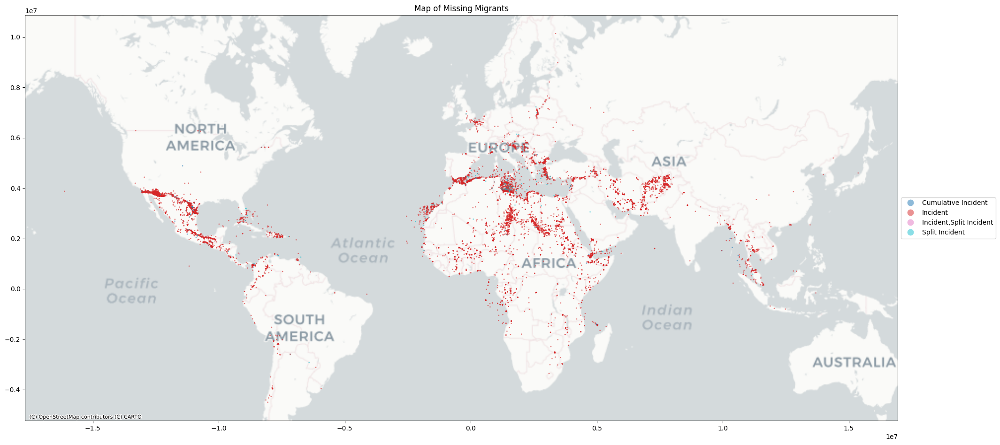

In [39]:
gdf_plot = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(24, 24))
gdf_plot.plot(
    column='Incident Type', 
    ax=ax, 
    alpha=0.5, 
    legend=True,
    s=1,
    legend_kwds = {
        "loc": "center left", 
        "bbox_to_anchor": (1, 0.5), 
        "fmt": "{:.0f}"
        },
    )

cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

ax.set_title("Map of Missing Migrants")

plt.show()

### Interactive Data Visualization

In [ ]:
gdf.explore(
    m = folium.Map(
        location=[0, 0], 
        tiles="OpenStreetMap",
        zoom_start=2,
        prefer_canvas=True
        ),
    popup=True,
    highlight=True,
    legend=True,
    control_scale=True,
    style_kwds = {
        'stroke': True,
        'color': '#3271a5',
        'weight': 1,
        'opacity': 0.90,
        'fill': True,
        'fillColor': '#b8e2f4',
        'fillOpacity': 0.20
    },
    highlight_kwds = {
        'stroke': True,
        'color': 'green',
        'weight': 5,
        'opacity': 1,
        'fill': True,
        'fillColor': '#88e788',
        'fillOpacity': 0.75
    },
    tooltip_kwds = {
        'labels': True
    }
)

## Methods & Attributes

### Dissolve by Incident Type

In [41]:
gdf.dissolve(by='Incident Type', sort=True)

,geometry,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping
Incident Type,,,,,,,,,,,,,,,,,,,
Cumulative Incident,"MULTIPOINT (-117.1611 32.71573, -114.62769 32....",2014,February,South-eastern Asia,South-eastern Asia,Myanmar,5,0,5,500,0,5,0,Sickness / lack of access to adequate healthcare,Migration Route is Unknown,"Hat Yai hospital, 182 Ratthakan, Hat Yai, Hat ...",Manager Online,"7.0167471, 100.4674982",South-eastern Asia
Incident,"MULTIPOINT (-144.77425 32.83105, -119.63429 35...",2014,January,Central America,North America,Guatemala,1,0,1,0,0,1,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America
"Incident,Split Incident","MULTIPOINT (-100.51127 28.70529, -82.37354 12....",2021,March,Western Africa,Northern Africa,"Guinea,Senegal,Unknown",3,0,3,0,0,2,0,"Drowning,Violence","Central Mediterranean,Sahara Desert crossing","Remains washed ashore at Sabratah, Libya,Unspe...",IOM Mali Displacement Tracking Matrix,"22.78182228, 5.435464559",Northern Africa
Split Incident,"MULTIPOINT (-117.25544 32.74727, -117.25349 32...",2014,April,Eastern Africa,Northern Africa,"Eritrea,Ethiopia,Sudan,Unknown",10,0,10,309,0,0,0,Harsh environmental conditions / lack of adequ...,Sahara Desert crossing,Sudanese-Libyan desert,Agence France Presse,"23.3112, 22",Northern Africa


### Dissolve by Incident year

In [42]:
gdf.dissolve(by='Incident year', sort=True, aggfunc='mean', numeric_only=True)

,geometry
Incident year,
2014,"MULTIPOINT (-117 32.5543, -113.75 32.83333, -1..."
2015,"MULTIPOINT (-117.12096 32.59152, -116.07947 32..."
2016,"MULTIPOINT (-119.63429 35.22109, -117.39887 33..."
2017,"MULTIPOINT (-117.68381 33.50633, -117.28844 32..."
2018,"MULTIPOINT (-117.13373 32.54188, -117.12468 32..."
2019,"MULTIPOINT (-117.04458 32.68486, -116.99954 32..."
2020,"MULTIPOINT (-117.26531 32.95949, -117.24704 32..."
2021,"MULTIPOINT (-117.27879 32.8478, -117.24794 32...."
2022,"MULTIPOINT (-144.77425 32.83105, -117.25544 32..."


### Dissolve by Reported Month

In [43]:
gdf.dissolve(by='Reported Month', sort=True, aggfunc='mean', numeric_only=True)

,geometry
Reported Month,
April,"MULTIPOINT (-117.25544 32.74727, -117.12373 32..."
August,"MULTIPOINT (-117.24704 32.7495, -117.08058 33...."
December,"MULTIPOINT (-117.1611 32.71573, -117.13373 32...."
February,"MULTIPOINT (-117.26531 32.95949, -117.15278 32..."
January,"MULTIPOINT (-117.12468 32.53347, -117.04742 32..."
July,"MULTIPOINT (-119.43216 49.02831, -117.39887 33..."
June,"MULTIPOINT (-117.68381 33.50633, -117.1238 32...."
March,"MULTIPOINT (-117.25352 32.89096, -117.25349 32..."
May,"MULTIPOINT (-117.27879 32.8478, -117.24794 32...."


### Append Column With Geometry Type for Each Record

In [44]:
print("Geometry Type")

gdf_gt = gdf.copy()
gdf_gt['geometry_type'] = gdf.geom_type

gdf_gt

Geometry Type


,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,...,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping,geometry,geometry_type
0,Incident,2014,January,Central America,North America,Guatemala,1,0,1,0,...,1,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America,POINT (-110.36645 31.65026),Point
1,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,...,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.59713, -111.73756",Northern America,POINT (-111.73756 31.59713),Point
2,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,...,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.94026, -113.01125",Northern America,POINT (-113.01125 31.94026),Point
3,Incident,2014,January,Central America,North America,Mexico,1,0,1,0,...,1,0,Violence,US-Mexico border crossing,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...","31.506777, -109.315632",Northern America,POINT (-109.31563 31.50678),Point
4,Incident,2014,January,Northern Africa,Europe,Sudan,1,0,1,2,...,1,0,Harsh environmental conditions / lack of adequ...,Migration Route is Unknown,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.1551, 28",Northern Europe,POINT (28 59.1551),Point
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13015,Incident,2023,July,Western Asia,Western Asia,Syrian Arab Republic,4,0,4,0,...,4,0,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"In Ipsala, Edirne province, Türkiye - travelli...","Andalou Agency, Son Dakika, Orient News","40.91271268, 26.369657",Western Asia,POINT (26.36966 40.91271),Point
13016,Incident,2023,July,Western Africa (P),Western Asia,Unknown,2,0,2,0,...,2,0,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"At the Kapıkule Türkiye-Bulgaria Border Gate, ...","Son Dakika, Hurriyet","41.71697242, 26.351489",Western Asia,POINT (26.35149 41.71697),Point
13017,Incident,2023,July,Western Africa,Northern Africa,Senegal,13,0,13,6,...,0,0,Drowning,Western Africa / Atlantic route to the Canary ...,"Off the coasts of Dakhla, Western Sahara - 6 s...","Barron's News, InfoMigrants, IOM Morrocco","23.72836078, -15.901632",Uncategorized,POINT (-15.90163 23.72836),Point
13018,Incident,2023,July,Mixed,Northern Africa,Unknown,6,0,6,48,...,0,0,Drowning,Western Africa / Atlantic route to the Canary ...,"Unspecified location off the coast of Nador, M...","El Nashra, Swiss Info; CGTN, IOM Morrocco","35.17187365, -2.903182",Uncategorized,POINT (-2.90318 35.17187),Point


### Determine Point's Distance From Harvard

In [45]:
# Use the Harvard address coordinates as the reference point for distances

latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)

if gdf.crs is None:
    gdf.set_crs(epsg=4326, inplace=True)

# Estimate an appropriate UTM CRS for your GeoDataFrame
utm_crs = gdf.estimate_utm_crs()

# Reproject your GeoDataFrame to the estimated UTM CRS
gdf_projected = gdf.to_crs(utm_crs)

# Reproject the reference point to the same UTM CRS
ref_point_projected = geopandas.GeoSeries([ref_point], crs='EPSG:4326').to_crs(utm_crs).iloc[0]

In [46]:
gdf_projected['dist_from_harvard'] = gdf_projected['geometry'].distance(ref_point)
gdf_projected['hausdorff_dist_from_harvard'] = gdf_projected['geometry'].hausdorff_distance(ref_point)
gdf_projected['frechet_dist_from_harvard'] = gdf_projected['geometry'].frechet_distance(ref_point)

gdf_projected

,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,...,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping,geometry,dist_from_harvard,hausdorff_dist_from_harvard,frechet_dist_from_harvard
0,Incident,2014,January,Central America,North America,Guatemala,1,0,1,0,...,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America,POINT (-6731488.792 12864525.635),1.451919e+07,1.451919e+07,1.451919e+07
1,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,...,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.59713, -111.73756",Northern America,POINT (-6624105.172 13057999.925),1.464200e+07,1.464200e+07,1.464200e+07
2,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1,0,1,0,...,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.94026, -113.01125",Northern America,POINT (-6459827.005 13191001.587),1.468774e+07,1.468774e+07,1.468774e+07
3,Incident,2014,January,Central America,North America,Mexico,1,0,1,0,...,Violence,US-Mexico border crossing,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...","31.506777, -109.315632",Northern America,POINT (-6840623.201 12729035.122),1.445062e+07,1.445062e+07,1.445062e+07
4,Incident,2014,January,Northern Africa,Europe,Sudan,1,0,1,2,...,Harsh environmental conditions / lack of adequ...,Migration Route is Unknown,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.1551, 28",Northern Europe,POINT (2228735.544 6974295.861),7.321734e+06,7.321734e+06,7.321734e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13015,Incident,2023,July,Western Asia,Western Asia,Syrian Arab Republic,4,0,4,0,...,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"In Ipsala, Edirne province, Türkiye - travelli...","Andalou Agency, Son Dakika, Orient News","40.91271268, 26.369657",Western Asia,POINT (2984836.352 4966868.549),5.794742e+06,5.794742e+06,5.794742e+06
13016,Incident,2023,July,Western Africa (P),Western Asia,Unknown,2,0,2,0,...,Vehicle accident / death linked to hazardous t...,Türkiye-Europe land route,"At the Kapıkule Türkiye-Bulgaria Border Gate, ...","Son Dakika, Hurriyet","41.71697242, 26.351489",Western Asia,POINT (2949842.242 5056338.51),5.853898e+06,5.853898e+06,5.853898e+06
13017,Incident,2023,July,Western Africa,Northern Africa,Senegal,13,0,13,6,...,Drowning,Western Africa / Atlantic route to the Canary ...,"Off the coasts of Dakhla, Western Sahara - 6 s...","Barron's News, InfoMigrants, IOM Morrocco","23.72836078, -15.901632",Uncategorized,POINT (-822575.449 2684768.861),2.807894e+06,2.807894e+06,2.807894e+06
13018,Incident,2023,July,Mixed,Northern Africa,Unknown,6,0,6,48,...,Drowning,Western Africa / Atlantic route to the Canary ...,"Unspecified location off the coast of Nador, M...","El Nashra, Swiss Info; CGTN, IOM Morrocco","35.17187365, -2.903182",Uncategorized,POINT (508816.291 3892107.76),3.925193e+06,3.925193e+06,3.925193e+06


### Retrieve Coordinates

In [47]:
gdf_get_coords = gdf.get_coordinates(include_z=True)
gdf_count_coords = gdf.count_coordinates()
gdf_count_geos = gdf.count_geometries()

print(f"GDF Coordinates:\n{gdf_get_coords}\n")
print(f"GDF Count Coordinates:\n{gdf_count_coords}\n")
print(f"GDF Count Geometries:\n{gdf_count_geos}")

GDF Coordinates:
                x          y   z
0     -110.366453  31.650259 NaN
1     -111.737560  31.597130 NaN
2     -113.011250  31.940260 NaN
3     -109.315632  31.506777 NaN
4       28.000000  59.155100 NaN
...           ...        ...  ..
13015   26.369657  40.912713 NaN
13016   26.351489  41.716972 NaN
13017  -15.901632  23.728361 NaN
13018   -2.903182  35.171874 NaN
13019  -17.506255  14.718707 NaN

[12984 rows x 3 columns]

GDF Count Coordinates:
0        1
1        1
2        1
3        1
4        1
        ..
13015    1
13016    1
13017    1
13018    1
13019    1
Length: 13020, dtype: int32

GDF Count Geometries:
0        1
1        1
2        1
3        1
4        1
        ..
13015    1
13016    1
13017    1
13018    1
13019    1
Length: 13020, dtype: int32


In [48]:
gdf.count_coordinates().mean()

0.9972350230414746

In [49]:
gdf.count_geometries().mean()

1.0

### Some Basic Functions

In [50]:
gdf_is_simple = gdf.is_simple
gdf_is_valid = gdf.is_valid
gdf_is_valid_reason = gdf.is_valid_reason()
gdf_has_z = gdf.has_z

gdf_is_simple_value_counts = gdf_is_simple.value_counts()
gdf_is_valid_value_counts = gdf_is_valid.value_counts()
gdf_is_valid_reason_value_counts = gdf_is_valid_reason.value_counts()
gdf_has_z_value_counts = gdf_has_z.value_counts()

print(f"is_simple:\n{gdf_is_simple_value_counts}\n")
print(f"is_valid:\n{gdf_is_valid_value_counts}\n")
print(f"is_valid_reason:\n{gdf_is_valid_reason_value_counts}\n")
print(f"has_z:\n{gdf_has_z_value_counts}\n")

is_simple:
True    13020
dtype: int64

is_valid:
True    13020
dtype: int64

is_valid_reason:
Valid Geometry    13020
dtype: int64

has_z:
False    13020
dtype: int64



### Some More Functions

In [51]:
gdf.envelope

0        POINT (-110.36645 31.65026)
1        POINT (-111.73756 31.59713)
2        POINT (-113.01125 31.94026)
3        POINT (-109.31563 31.50678)
4                 POINT (28 59.1551)
                    ...             
13015      POINT (26.36966 40.91271)
13016      POINT (26.35149 41.71697)
13017     POINT (-15.90163 23.72836)
13018      POINT (-2.90318 35.17187)
13019     POINT (-17.50626 14.71871)
Length: 13020, dtype: geometry

In [52]:
gdf.extract_unique_points()

0        MULTIPOINT (-110.36645 31.65026)
1        MULTIPOINT (-111.73756 31.59713)
2        MULTIPOINT (-113.01125 31.94026)
3        MULTIPOINT (-109.31563 31.50678)
4                 MULTIPOINT (28 59.1551)
                       ...               
13015      MULTIPOINT (26.36966 40.91271)
13016      MULTIPOINT (26.35149 41.71697)
13017     MULTIPOINT (-15.90163 23.72836)
13018      MULTIPOINT (-2.90318 35.17187)
13019     MULTIPOINT (-17.50626 14.71871)
Length: 13020, dtype: geometry

In [53]:
gdf.force_2d()

0        POINT (-110.36645 31.65026)
1        POINT (-111.73756 31.59713)
2        POINT (-113.01125 31.94026)
3        POINT (-109.31563 31.50678)
4                 POINT (28 59.1551)
                    ...             
13015      POINT (26.36966 40.91271)
13016      POINT (26.35149 41.71697)
13017     POINT (-15.90163 23.72836)
13018      POINT (-2.90318 35.17187)
13019     POINT (-17.50626 14.71871)
Length: 13020, dtype: geometry

In [54]:
gdf.minimum_bounding_circle()

0        POINT (-110.36645 31.65026)
1        POINT (-111.73756 31.59713)
2        POINT (-113.01125 31.94026)
3        POINT (-109.31563 31.50678)
4                 POINT (28 59.1551)
                    ...             
13015      POINT (26.36966 40.91271)
13016      POINT (26.35149 41.71697)
13017     POINT (-15.90163 23.72836)
13018      POINT (-2.90318 35.17187)
13019     POINT (-17.50626 14.71871)
Length: 13020, dtype: geometry

In [55]:
gdf.remove_repeated_points()

0        POINT (-110.36645 31.65026)
1        POINT (-111.73756 31.59713)
2        POINT (-113.01125 31.94026)
3        POINT (-109.31563 31.50678)
4                 POINT (28 59.1551)
                    ...             
13015      POINT (26.36966 40.91271)
13016      POINT (26.35149 41.71697)
13017     POINT (-15.90163 23.72836)
13018      POINT (-2.90318 35.17187)
13019     POINT (-17.50626 14.71871)
Length: 13020, dtype: geometry

### Transform Markers/Points

In [56]:
gdf['geometry'].transform(lambda x: x + [1, 2])

0        POINT (-109.36645 33.65026)
1        POINT (-110.73756 33.59713)
2        POINT (-112.01125 33.94026)
3        POINT (-108.31563 33.50678)
4                 POINT (29 61.1551)
                    ...             
13015      POINT (27.36966 42.91271)
13016      POINT (27.35149 43.71697)
13017     POINT (-14.90163 25.72836)
13018      POINT (-1.90318 37.17187)
13019     POINT (-16.50626 16.71871)
Length: 13020, dtype: geometry

### Interface

In [ ]:
gdf.__geo_interface__

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

In [ ]:
for feature in gdf.iterfeatures():
    print(feature)
    
# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

# Save Cleaned Dataset to File

In [60]:
new_file_path = "cleaned_dataset.geojson"

gdf.to_file(
    new_file_path, 
    driver="GeoJSON"
    )

### Resources Used (links to libraries used in this project)

- GeoPandas: https://geopandas.org/en/stable/